# PROJECT - Lesion Classification 

Lucas Pereira Fernandes - May 2022 - Telecom Paris


A skin lesion is defined as a superficial growth or patch of the skin that is visually different and/or has a different texture than its surrounding area. Skin lesions, such as moles or birthmarks, can degenerate and become cancer, with melanoma being the deadliest skin cancer. Its incidence has increased during the last decades, especially in the areas mostly populated by white people.

The most effective treatment is an early detection followed by surgical excision. This is why several approaches for skin cancer detection have been proposed in the last years (non-invasive computer-aided diagnosis (CAD)).

The goal of this challenge is to classify dermoscopic images of skin lesions among eight different diagnostic classes:

1. Melanoma
2. Melanocytic nevus
3. Basal cell carcinoma
4. Actinic keratosis
5. Benign keratosis
6. Dermatofibroma
7. Vascular lesion
8. Squamous cell carcinoma

In order to do that, we will extract features such as the Asymmetry, the Border irregularity, the Colour and the Dimension of the lesion (usually called the ABCD rule). After that, we will use machine learning algorithms to classify the images.





In [ ]:
import numpy as np
import pandas as pd

import os 
import shutil

import scipy
import skimage
import cv2
from skimage.io import imread, imsave
from skimage import morphology, img_as_bool, img_as_ubyte
from skimage.measure import regionprops, regionprops_table, shannon_entropy
from scipy.ndimage import binary_dilation
from scipy.ndimage.morphology import distance_transform_edt
from skimage.transform import resize, rotate
from scipy.spatial.distance import dice
from google.colab import files

import sklearn
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.model_selection import  cross_val_score, cross_validate, GridSearchCV, KFold, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import class_weight
from sklearn.utils.multiclass import unique_labels
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn import decomposition
from sklearn.preprocessing import StandardScaler, MinMaxScaler


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model 
from tensorflow.keras.layers import Rescaling, Dense, Dropout, Activation, Flatten, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras import optimizers


import matplotlib.pyplot as plt

In [ ]:
print(f'tensorflow version = {tf.__version__}')
print(f'sklearn version = {sklearn.__version__}')
print(f'skimage version = {skimage.__version__}')
print(f'scipy version = {scipy.__version__}')
print(f'numpy version = {np.__version__}')
print(f'pandas version = {pd.__version__}')
print(f'cv2 version = {cv2.__version__}')

tensorflow version = 2.8.0
sklearn version = 1.0.2
skimage version = 0.18.3
scipy version = 1.4.1
numpy version = 1.21.6
pandas version = 1.3.5
cv2 version = 4.1.2


In [ ]:
!nvidia-smi

Fri May  6 08:20:20 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## 1. Image pre-processing:

### 1.1 Download:

This cell downloads files that were given in the challenge and also the resulting files.

In [ ]:
## CENSORED IN THE GIT UPLOADED VERSION

### 1.2 Exploring the dataset:

#### 1.2.1 Metadata:

In [ ]:
df_md_train = pd.read_csv('metadataTrain.csv')
print(f'Train metadata shape = {df_md_train.shape}')
df_md_train.head()  

Train metadata shape = (18998, 5)


,ID,CLASS,SEX,AGE,POSITION
0,ISIC_0028766,2,male,30.0,NaN
1,ISIC_0071222,8,male,85.0,lower extremity
2,ISIC_0069434,3,male,85.0,head/neck
3,ISIC_0062098,1,male,55.0,head/neck
4,ISIC_0057224,8,female,45.0,lower extremity


In [ ]:
df_md_test = pd.read_csv('metadataTest.csv')
print(f'Test metadata shape = {df_md_test.shape}')
df_md_test.head() 

Test metadata shape = (6333, 4)


,ID,SEX,AGE,POSITION
0,ISIC_0055289,female,50.0,lower extremity
1,ISIC_0062682,male,65.0,lower extremity
2,ISIC_0057706,female,75.0,NaN
3,ISIC_0031702,male,70.0,head/neck
4,ISIC_0069272,male,60.0,lower extremity


In [ ]:
classes = np.sort(pd.unique(df_md_train['CLASS']))
classes

array([1, 2, 3, 4, 5, 6, 7, 8])

Skin lesion classes' names:

In [ ]:
classes_name = ['Melanoma', 'Melanocytic nevus', 'Basal cell carcinoma',
               'Actinic keratosis', 'Benign keratosis', 'Dermatofibroma',
               'Vascular lesion', 'Squamous cell carcinoma']

Data from one class:

In [ ]:
df_md_train[df_md_train['CLASS']==1]

,ID,CLASS,SEX,AGE,POSITION
3,ISIC_0062098,1,male,55.0,head/neck
8,ISIC_0067798,1,male,55.0,anterior torso
11,ISIC_0065433,1,female,75.0,upper extremity
13,ISIC_0029209,1,male,50.0,upper extremity
14,ISIC_0053617,1,female,70.0,lower extremity
...,...,...,...,...,...
18977,ISIC_0059684,1,male,50.0,anterior torso
18986,ISIC_0065341,1,female,35.0,anterior torso
18987,ISIC_0058138,1,male,65.0,upper extremity
18992,ISIC_0055759,1,female,60.0,lower extremity


#### 1.2.2 Image files:

In [ ]:
total_train_files = os.listdir('Train')
print(f'Total train image files = {len(total_train_files)}')
seg_train_files = [file for file in total_train_files if '_seg' in file]
print(f'Segmentation train image files = {len(seg_train_files)}')
print(f'Train files = {len(total_train_files) - len(seg_train_files)}')

Total train image files = 20943
Segmentation train image files = 1945
Train files = 18998


In [ ]:
total_test_files = os.listdir('Test')
print(f'Total test image files = {len(total_test_files)}')
seg_test_files = [file for file in total_test_files if '_seg' in file]
print(f'Segmentation test image files = {len(seg_test_files)}')
print(f'Test files = {len(total_test_files) - len(seg_test_files)}')

Total test image files = 6981
Segmentation test image files = 648
Test files = 6333


Therefore, we know that just some images have a pre-made segmentation.

We can see an image and its segmentation:

In [ ]:
seg_train_files[5]

'ISIC_0014076_seg.png'

im1.shape = (340, 512, 3)
im2.shape (seg) = (340, 512)


Text(0.5, 1.0, 'Skin lesion image segmentation')

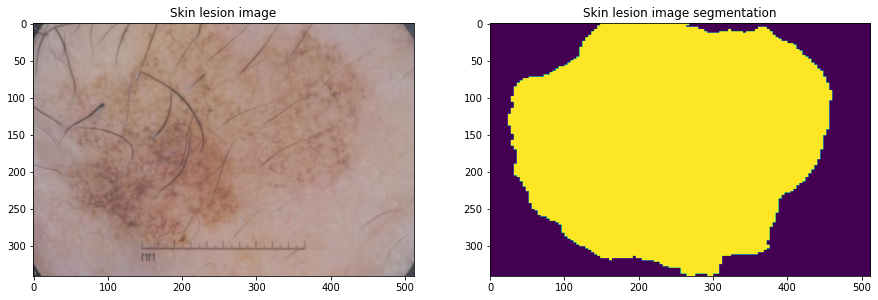

In [ ]:
im1 = imread(f'Train/{seg_train_files[5][:-8]}.jpg')
im2 = imread(f'Train/{seg_train_files[5]}')
print(f'im1.shape = {im1.shape}\nim2.shape (seg) = {im2.shape}')

f, ax = plt.subplots(1,2,figsize=(15,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im2)
ax[1].set_title('Skin lesion image segmentation')

Also, we know that the images may have different shapes: 

im1.shape = (340, 512, 3)
im3.shape = (225, 300, 3)


Text(0.5, 1.0, 'Skin lesion image (different shape)')

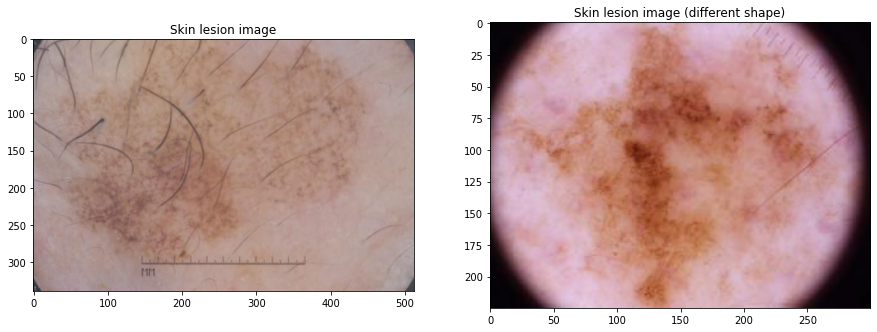

In [ ]:
im3 = imread(f'Train/{total_train_files[3]}')
print(f'im1.shape = {im1.shape}\nim3.shape = {im3.shape}')

f, ax = plt.subplots(1,2,figsize=(15,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im3)
ax[1].set_title('Skin lesion image (different shape)')

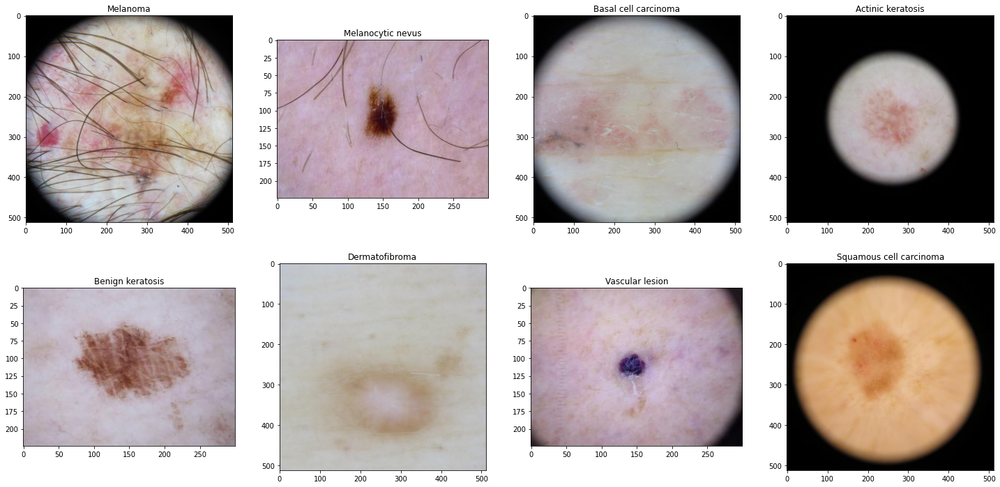

In [ ]:
f, ax = plt.subplots(2,4,figsize=(25,12))
for label in classes:
    im4 = imread(f'Train/{df_md_train[df_md_train["CLASS"]==label].iloc[0]["ID"]}.jpg')
    ax.flatten()[label-1].imshow(im4)
    ax.flatten()[label-1].set_title(classes_name[label-1])

### 1.3 Segmentation:

#### 1.3.1 Exploring and defining functions:

In all segmentations, the closing operation was applied in order to reduce the hair's influence.

In [ ]:
def img_closing(img, disksize = 3):
  img = morphology.closing(img, morphology.selem.disk(disksize)) #closing blue channel
  return img

As we saw in section 1.2.2, some images already have their segmentation mask, therefore, we must find all segmentations and create a new segmented dataset.

In [ ]:
def find_segmentation_kmeans(img, Nclusters=2): 
  '''
  Find a skin lesion image segmentation based on k-means clustering.

  Parameters 
  ------------
  img: numpy.ndarray
    Skin lesion image.

  Nclusters: int, default = 2
    Number of clusters using k-means.

  Return
  -------
  seg_img: numpy.ndarray
    Skin lesion image after segmentation
  kmeansSeg_bool: numpy.ndarray
    Boolean array that represents the skin lesion image segmentation.
  '''

  imbr = img_closing(img[:,:,2]) #closing of blue channel
  x, y = imbr.shape
  imFloat = imbr.astype('float64')/255 # transform into float for computational reason
  kmeans = KMeans(n_clusters=Nclusters) # use K-means algorithm 
  kmeansSeg = kmeans.fit_predict(imFloat.reshape(-1,1)) # fit to the data reshaped as a 1D vector
  kmeansSeg = np.reshape(kmeansSeg,(x,y)) # reshape as the initial image
  kmeansSeg_bool = kmeansSeg == 1
  
  return  kmeansSeg_bool

In [ ]:
seg_test = find_segmentation_kmeans(im1, Nclusters = 2)

In [ ]:
im2 = im2==255

In [ ]:
im2

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

The dice similarity is  0.32713978909775343


Text(0.5, 1.0, 'Skin lesion image segmentation using kmeans')

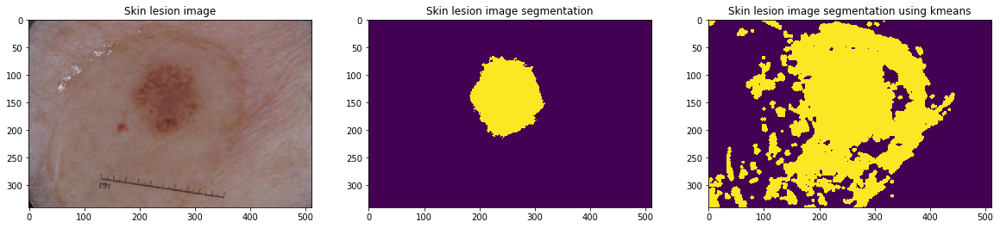

In [ ]:
print('The dice similarity is ', 1-dice(seg_test.flatten(),im2.flatten()))

f, ax = plt.subplots(1,3,figsize=(20,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im2)
ax[1].set_title('Skin lesion image segmentation')
ax[2].imshow(seg_test)
ax[2].set_title('Skin lesion image segmentation using kmeans')

Do we find better dice similarity results using 3 clusters? 

The dice similarity is  0.0


Text(0.5, 1.0, 'Skin lesion image segmentation using kmeans')

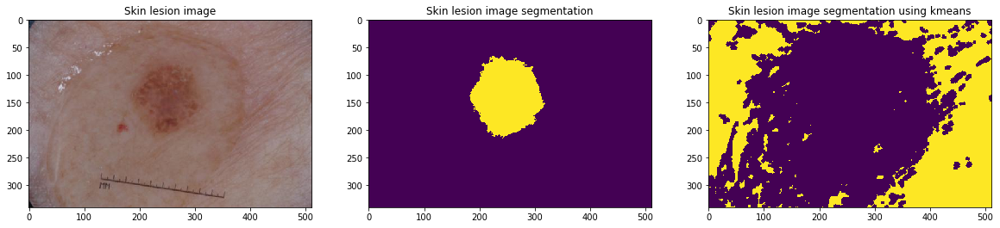

In [ ]:
seg_test = find_segmentation_kmeans(im1, Nclusters = 3)
print('The dice similarity is ', 1-dice(seg_test.flatten(),im2.flatten()))

f, ax = plt.subplots(1,3,figsize=(20,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im2)
ax[1].set_title('Skin lesion image segmentation')
ax[2].imshow(seg_test)
ax[2].set_title('Skin lesion image segmentation using kmeans')

We cannot be sure if the target region is the one labeled as 1, then it is not a good option in this case.

How about using OTSU's algorithm ? 

In [ ]:
def find_segmentation_otsu(img):
    
    img = img_closing(img[:,:,2]) #blue channel closing
    min_sigma = np.inf
    tau_out = 0
    min_level = 0.0
    max_level = 255.0
    n_levels = 256
    for tau in np.linspace(min_level, max_level,n_levels):
        # first, get weights of the two regions
        flag = img < tau
        omega_0 = np.count_nonzero(flag)
        omega_1 = np.count_nonzero(~flag)

        # only analyse thresholds which give two non-empty regions
        if (omega_0 and omega_1):
            sigma_0 = img[flag].var()
            sigma_1 = img[~flag].var()

            sigma_total = omega_0*sigma_0 + omega_1*sigma_1

            if (sigma_total < min_sigma):
                tau_out = tau
                min_sigma = sigma_total

    img_out = np.zeros((img.shape[0],img.shape[1]))
    img_out[img<tau_out] = 1
    img_out = img_out.astype(int)
    return img_out

The dice similarity is  0.37458554376657827


Text(0.5, 1.0, 'Skin lesion image segmentation using otsu')

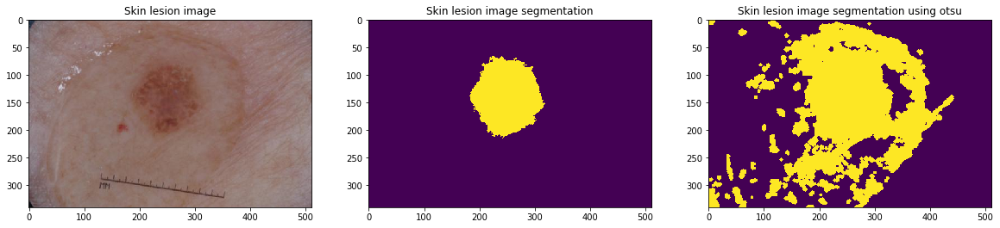

In [ ]:
otsu = find_segmentation_otsu(im1)

print('The dice similarity is ', 1-dice(otsu.flatten(),im2.flatten()))

f, ax = plt.subplots(1,3,figsize=(20,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im2)
ax[1].set_title('Skin lesion image segmentation')
ax[2].imshow(otsu)
ax[2].set_title('Skin lesion image segmentation using otsu')

It seems good but not perfect.

Then, we can use Otsu segmentation' center of mass to apply a region growing segmentation algorithm:

In [ ]:
properties = regionprops(otsu, im1)
center_of_mass = properties[0].centroid
center_of_mass = (center_of_mass[0].astype(int), center_of_mass[1].astype(int))

In [ ]:
def initialize_segmentation(seed_pt,img_shape):
    seg_init = np.zeros(img_shape).astype(float)
    seg_init[ seed_pt[0], seed_pt[1]] = 1
    dist = distance_transform_edt(np.abs(1-seg_init))

    # initialise the seeded region with a certain radius
    size_radius = 5
    seg_init = dist < size_radius
    return seg_init


def find_segmentation_region_growing(img,seed_pt, tau = 18, disksize=10):

    img = img_closing(img[:,:,2]) #closing blue channel
    # define the neighbourhood (for instance 4-connected pixels)
    nbhood = np.asarray( [ [0,1,0],[1,1,1],[0,1,0]] )

    seg_init = initialize_segmentation(seed_pt,img.shape)
    seg_n_plus_1 = seg_init
    seg_n = np.zeros(seg_n_plus_1.shape)

    # loop while the region can still keep growing
    while( np.abs(seg_n_plus_1 != seg_n).sum() != 0):
        seg_n = seg_n_plus_1
        seg_n_plus_1 = binary_dilation(seg_n, structure=nbhood).astype(seg_n.dtype)
        # calculate average value
        avg = np.sum( img[seg_n>0] ) / ( float(seg_n.sum()))
        seg_n_plus_1 = np.logical_and( seg_n_plus_1 , np.abs( img-avg ) < tau)
        # do not lose previous points of the segmentation
        seg_n_plus_1 = np.logical_or( seg_n_plus_1 , seg_n)
    
    if disksize:
      closeDisk = morphology.closing(seg_n, morphology.selem.disk(disksize))
      seg_n = closeDisk

    return seg_n

In [ ]:
tau = 18
img_out_region_growing = find_segmentation_region_growing(im1, center_of_mass, tau, disksize=10)

The dice similarity is  0.9688154352378103


Text(0.5, 1.0, 'Skin lesion image segmentation using region growing')

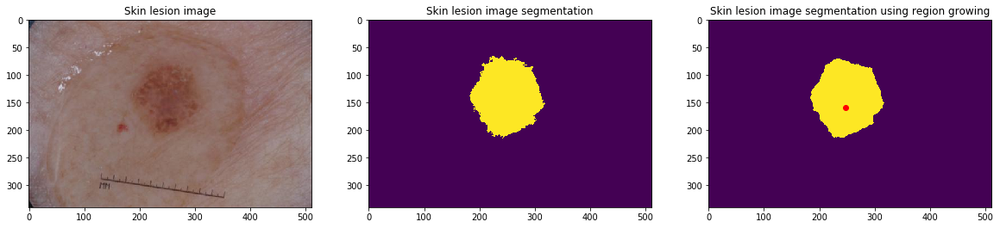

In [ ]:
print('The dice similarity is ', 1-dice(img_out_region_growing.flatten(),im2.flatten()))

f, ax = plt.subplots(1,3,figsize=(20,6))
ax[0].imshow(im1)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im2)
ax[1].set_title('Skin lesion image segmentation')
ax[2].imshow(img_out_region_growing)
ax[2].scatter(center_of_mass[1], center_of_mass[0], color = 'r')
ax[2].set_title('Skin lesion image segmentation using region growing')

#### 1.3.2 Finding the best segmentation parameters:

We must evaluate which segmentation algorithm achieves the best dice similarity, using the given segmentation images, in order to apply the method in the whole dataset.

First, we can notice that, using kmeans with only two clusters may cause problems since we cannot garantee whether our target region will be assigned as one or zero. Also, most of the times, the result is the same as using Otsu algorithm:

In [ ]:
im = imread(f'Train/{seg_train_files[0][:-8]}.jpg')
im_seg = imread(f'Train/{seg_train_files[0]}')

im_seg = im_seg == 255
im_seg_flatten = im_seg.flatten()

seg_kmeans = find_segmentation_kmeans(im, Nclusters = 2)
seg_otsu = find_segmentation_otsu(im)

properties = regionprops(seg_otsu, im)
center_of_mass = properties[0].centroid
center_of_mass = (center_of_mass[0].astype(int), center_of_mass[1].astype(int))

seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau = 28, disksize=10)

dd_kmeans = 1-dice(seg_kmeans.flatten(), im_seg_flatten)
dd_otsu = 1-dice(seg_otsu.flatten(), im_seg_flatten) 
dd_region_growing = 1-dice(seg_region_growing.flatten(), im_seg_flatten)

K-means (2 clusters) segmentation dice similarity: 0.3746790532654871
Otsu segmentation dice similarity: 0.7668107756316389
Region growing dice similarity: 0.5962760855905017


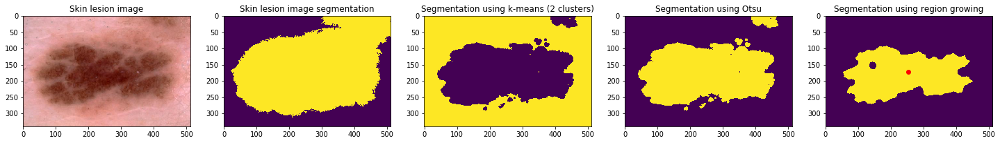

In [ ]:
print(f'K-means (2 clusters) segmentation dice similarity: {dd_kmeans}')
print(f'Otsu segmentation dice similarity: {dd_otsu}')
print(f'Region growing dice similarity: {dd_region_growing}')

f, ax = plt.subplots(1,5,figsize=(25,6))
ax[0].imshow(im)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im_seg)
ax[1].set_title('Skin lesion image segmentation')
ax[2].set_title('Segmentation using k-means (2 clusters)')
ax[2].imshow(seg_kmeans)
ax[3].set_title('Segmentation using Otsu')
ax[3].imshow(seg_otsu)
ax[4].set_title('Segmentation using region growing')
ax[4].scatter(center_of_mass[1], center_of_mass[0], color = 'r')
ax[4].imshow(seg_region_growing)

Then, the following function will find the best region growing parameters, using Otsu segmentation to find the start point.

In [ ]:
def find_best_params_region_growing(im, im_seg_flatten, center_of_mass): #search best tau

  best_dice = 0
  tau = 4 #starting tau
  best_tau = tau
  seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau=tau, disksize=10)
  dice_rg = 1-dice(seg_region_growing.flatten(), im_seg_flatten)

  while dice_rg > best_dice: #if the dice simmilarity is better than the last one, saves the tau
    best_tau = tau
    best_dice = dice_rg
    tau += 3
    seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau=tau, disksize=10)
    dice_rg = 1-dice(seg_region_growing.flatten(), im_seg_flatten)

  return best_tau

In [ ]:
%%time
im = imread(f'Train/{seg_train_files[52][:-8]}.jpg')
im_seg = imread(f'Train/{seg_train_files[52]}')

im_seg = im_seg == 255
im_seg_flatten = im_seg.flatten()

seg_otsu = find_segmentation_otsu(im)

properties = regionprops(seg_otsu, im)
center_of_mass = properties[0].centroid #centroid of the segmentation
center_of_mass = (center_of_mass[0].astype(int), center_of_mass[1].astype(int))

best_tau_test = find_best_params_region_growing(im, im_seg_flatten, center_of_mass)
seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau = best_tau_test, disksize=10)

dd_otsu = 1-dice(seg_otsu.flatten(), im_seg_flatten) 
dd_region_growing = 1-dice(seg_region_growing.flatten(), im_seg_flatten)

CPU times: user 4.01 s, sys: 640 µs, total: 4.01 s
Wall time: 4.01 s


In [ ]:
print(f'The best tau is: {best_tau_test}')

The best tau is: 13


Plotting the best segmentation using the proposed strategy:

Otsu segmentation dice similarity: 0.8708719116700501
Region growing dice similarity: 0.9696384211979023


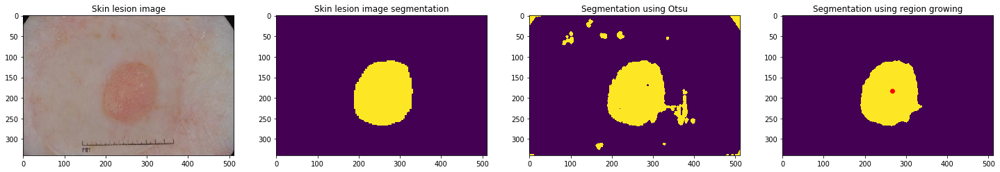

In [ ]:
print(f'Otsu segmentation dice similarity: {dd_otsu}')
print(f'Region growing dice similarity: {dd_region_growing}')

f, ax = plt.subplots(1,4,figsize=(25,6))
ax[0].imshow(im)
ax[0].set_title('Skin lesion image')
ax[1].imshow(im_seg)
ax[1].set_title('Skin lesion image segmentation')
ax[2].set_title('Segmentation using Otsu')
ax[2].imshow(seg_otsu)
ax[3].set_title('Segmentation using region growing')
ax[3].scatter(center_of_mass[1], center_of_mass[0], color = 'r')
ax[3].imshow(seg_region_growing)

Finally, we can find the best tau for the whole train dataset:

In [ ]:
def find_best_segmentation(seg_train_files):  

  n_seg = len(seg_train_files)
  best_tau_ar = np.zeros(n_seg)
  dice_otsu = np.zeros(n_seg)
  dice_region_growing = np.zeros(n_seg)


  for pos, seg_file in enumerate(seg_train_files):
    im = imread(f'Train/{seg_file[:-8]}.jpg')
    im_seg = imread(f'Train/{seg_file}')

    im_seg = im_seg == 255
    im_seg_flatten = im_seg.flatten()

    seg_otsu = find_segmentation_otsu(im)

    properties = regionprops(seg_otsu, im)
    center_of_mass = properties[0].centroid
    center_of_mass = (center_of_mass[0].astype(int), center_of_mass[1].astype(int))

    best_tau_ar[pos] = find_best_params_region_growing(im, im_seg_flatten, center_of_mass)
    seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau = best_tau_ar[pos], disksize=10)

    dice_otsu[pos] = 1-dice(seg_otsu.flatten(), im_seg_flatten) #abs
    dice_region_growing[pos] = 1-dice(seg_region_growing.flatten(), im_seg_flatten)

  return dice_otsu, dice_region_growing, best_tau_ar

In [ ]:
%%time 
dice_otsu, dice_region_growing, best_tau_ar = find_best_segmentation(seg_train_files)

CPU times: user 5h 25min 12s, sys: 16.6 s, total: 5h 25min 28s
Wall time: 5h 26min 2s


In [ ]:
np.save('dice_otsu.npy', dice_otsu)
np.save('dice_region_growing.npy', dice_region_growing)
np.save('best_tau.npy', best_tau_ar)

We got the following values for the dice similarity using the otsu algorithm and the region growing:

In [ ]:
dice_otsu.mean()

0.6625234551089223

In [ ]:
dice_region_growing.mean()

0.7264663898360799

The best tau for the whole dataset is:

In [ ]:
best_tau = round(best_tau_ar.mean())
best_tau

39

#### 1.3.3 Saving segmentation masks:

In this section, the segmentation masks are saved in a folder.

In [ ]:
train_list = list(set(total_train_files) - set(seg_train_files))
train_list

['ISIC_0056106.jpg',
 'ISIC_0027505.jpg',
 'ISIC_0025729.jpg',
 'ISIC_0064466.jpg',
 'ISIC_0060755.jpg',
 'ISIC_0025639.jpg',
 'ISIC_0064518.jpg',
 'ISIC_0029819.jpg',
 'ISIC_0068586.jpg',
 'ISIC_0025980.jpg',
 'ISIC_0058101.jpg',
 'ISIC_0026963.jpg',
 'ISIC_0066029.jpg',
 'ISIC_0055802.jpg',
 'ISIC_0030323.jpg',
 'ISIC_0058030.jpg',
 'ISIC_0066384.jpg',
 'ISIC_0061087.jpg',
 'ISIC_0030919.jpg',
 'ISIC_0058192.jpg',
 'ISIC_0067915.jpg',
 'ISIC_0031395.jpg',
 'ISIC_0032059.jpg',
 'ISIC_0062162.jpg',
 'ISIC_0012495.jpg',
 'ISIC_0063359.jpg',
 'ISIC_0071000.jpg',
 'ISIC_0027890.jpg',
 'ISIC_0033572.jpg',
 'ISIC_0028735.jpg',
 'ISIC_0032015.jpg',
 'ISIC_0028556.jpg',
 'ISIC_0065157.jpg',
 'ISIC_0014369.jpg',
 'ISIC_0055712.jpg',
 'ISIC_0066439.jpg',
 'ISIC_0008659.jpg',
 'ISIC_0029921.jpg',
 'ISIC_0068682.jpg',
 'ISIC_0066549.jpg',
 'ISIC_0065636.jpg',
 'ISIC_0011162.jpg',
 'ISIC_0033693.jpg',
 'ISIC_0013364.jpg',
 'ISIC_0067448.jpg',
 'ISIC_0033831.jpg',
 'ISIC_0057655.jpg',
 'ISIC_003379

In [ ]:
test_list = list(set(total_test_files) - set(seg_test_files))
test_list

['ISIC_0056246.jpg',
 'ISIC_0069728.jpg',
 'ISIC_0058542.jpg',
 'ISIC_0025461.jpg',
 'ISIC_0025714.jpg',
 'ISIC_0024433.jpg',
 'ISIC_0028592.jpg',
 'ISIC_0031008.jpg',
 'ISIC_0065186.jpg',
 'ISIC_0033962.jpg',
 'ISIC_0024797.jpg',
 'ISIC_0027383.jpg',
 'ISIC_0071817.jpg',
 'ISIC_0061186.jpg',
 'ISIC_0066014.jpg',
 'ISIC_0028407.jpg',
 'ISIC_0069144.jpg',
 'ISIC_0010586.jpg',
 'ISIC_0027397.jpg',
 'ISIC_0034176.jpg',
 'ISIC_0029755.jpg',
 'ISIC_0032942.jpg',
 'ISIC_0013935.jpg',
 'ISIC_0014264.jpg',
 'ISIC_0064286.jpg',
 'ISIC_0000453.jpg',
 'ISIC_0030662.jpg',
 'ISIC_0069483.jpg',
 'ISIC_0071200.jpg',
 'ISIC_0056530.jpg',
 'ISIC_0067539.jpg',
 'ISIC_0070817.jpg',
 'ISIC_0028689.jpg',
 'ISIC_0066565.jpg',
 'ISIC_0025673.jpg',
 'ISIC_0060390.jpg',
 'ISIC_0064639.jpg',
 'ISIC_0025746.jpg',
 'ISIC_0028086.jpg',
 'ISIC_0024846.jpg',
 'ISIC_0064364.jpg',
 'ISIC_0073240.jpg',
 'ISIC_0066109.jpg',
 'ISIC_0070850.jpg',
 'ISIC_0073181.jpg',
 'ISIC_0029292.jpg',
 'ISIC_0061891.jpg',
 'ISIC_002932

In [ ]:
def save_segmentation(file, best_tau, dataset):  
    im = imread(f'{dataset}/{file}')

    seg_otsu = find_segmentation_otsu(im)

    properties = regionprops(seg_otsu, im)
    center_of_mass = properties[0].centroid
    center_of_mass = (center_of_mass[0].astype(int), center_of_mass[1].astype(int))

    seg_region_growing = find_segmentation_region_growing(im, center_of_mass, tau = best_tau, disksize=10)
    filename = f'./{dataset}_seg/{file[:-4]}_seg.png'
    imsave(filename, seg_region_growing)

In [ ]:
%%time
for file in train_list:
    save_segmentation(file, best_tau, 'Train')

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056106_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027505_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025729_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025729_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028735_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032015_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028556_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028556_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070694_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070694_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028846_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062331_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031863_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033887_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030166_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059490_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027439_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000228_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071778_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025444_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060355_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070275_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031504_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031504_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027230_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027230_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014233_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029409_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061531_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030737_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056860_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070352_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060312_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025059_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070994_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070994_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033757_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069706_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027710_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027710_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027524_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031987_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025775_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031379_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069321_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032367_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026178_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061783_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032584_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000537_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069624_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026115_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028185_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060352_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064198_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063013_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032291_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031658_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059182_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055553_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060588_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067746_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028743_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025609_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025609_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069847_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056942_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057318_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057751_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063044_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061606_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071897_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030473_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024933_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029463_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029463_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032114_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000436_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056649_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034119_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069485_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000491_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063727_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065836_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061781_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061781_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072159_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029745_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026617_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027826_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055624_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061894_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031345_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068107_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014255_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014255_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034016_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010003_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069635_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030971_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030971_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030357_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032939_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055603_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025403_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025403_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032483_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032203_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032203_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070131_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034031_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014583_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065890_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065890_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060693_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065714_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056992_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068479_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055701_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059134_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030648_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070173_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025022_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063045_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066594_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063758_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028904_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058508_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066671_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014932_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060461_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0001960_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029285_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063536_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025290_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061212_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056343_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055718_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053858_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058967_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068667_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012806_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012806_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070006_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060663_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032268_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032268_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030012_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070800_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070465_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067770_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071180_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065819_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031388_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060774_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025800_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024995_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054122_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033024_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032954_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013945_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010186_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056269_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031328_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057913_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030005_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030005_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059087_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024863_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000352_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029249_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064023_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065701_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067443_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067469_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057266_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012406_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012406_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028451_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012998_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070546_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054105_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072919_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013325_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063960_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031178_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056359_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062046_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029614_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072456_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058649_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025759_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068285_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026309_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072373_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061192_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053681_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010225_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033724_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031276_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056913_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024444_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067576_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054912_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054359_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071157_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025785_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054162_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072740_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025986_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055185_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024401_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061317_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069383_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026357_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026357_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055181_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013053_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028120_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071467_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071467_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029716_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058417_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013456_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013456_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070122_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031565_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055388_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055984_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025441_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033265_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063877_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027974_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013310_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013310_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029252_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028675_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060627_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030510_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030510_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064062_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010447_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072207_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030823_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057865_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032863_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059962_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070513_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064138_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034260_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056968_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024563_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072101_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062298_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057257_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064007_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062048_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029512_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014848_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030421_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024956_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069683_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027381_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065766_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027927_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030642_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030642_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032665_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027090_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027917_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067466_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032314_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063149_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024446_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055132_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055132_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014807_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026609_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026609_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028125_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009961_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065613_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032199_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026081_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027352_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026316_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026316_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012517_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012517_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025745_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054770_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030589_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026813_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026813_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055851_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032789_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032789_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033759_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031822_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058828_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072262_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060719_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071369_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071410_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063832_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028137_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072994_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072994_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028808_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027584_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027584_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059037_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069373_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068645_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054700_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071772_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071772_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031015_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029268_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032424_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058350_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030548_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015298_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029019_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054732_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012659_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030826_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026722_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026722_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034304_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030967_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029070_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058964_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069794_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033549_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059608_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070752_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030019_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060107_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060107_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012464_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029539_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029539_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028208_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070351_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027450_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062828_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072552_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012183_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012183_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056730_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061526_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013007_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027104_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067218_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067218_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025308_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025308_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024419_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054811_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033975_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068599_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029139_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025691_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0008347_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027010_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033032_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027243_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072249_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065980_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029591_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027547_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027547_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025356_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025016_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025016_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025946_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032259_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057286_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056622_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030300_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071031_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067762_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025502_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070676_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031775_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032515_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033748_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059442_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055509_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063970_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067424_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064387_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064387_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071719_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063669_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063653_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058149_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027464_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059108_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032755_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054843_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056344_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030925_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025254_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064292_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026764_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028485_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028485_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069344_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032548_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061280_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070689_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012141_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032579_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061171_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0004110_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024627_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054598_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029303_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067128_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066585_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055977_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026282_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012342_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012342_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027299_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012358_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012358_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064036_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0001103_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069015_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033609_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059285_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071502_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014458_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010443_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069145_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063484_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069698_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010005_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068268_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025395_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064018_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064018_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068871_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064329_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059485_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068661_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014299_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029989_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063819_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034208_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028443_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056720_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054171_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054171_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064064_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055897_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055897_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054019_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067323_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024651_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064781_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053618_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069871_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061516_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034126_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062017_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062017_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025904_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060773_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000109_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027566_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069505_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071075_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056654_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028355_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064283_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068387_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058812_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031266_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058482_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029832_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029832_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073245_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030937_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054085_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026087_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027459_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026693_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026693_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010593_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057600_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057898_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072999_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058489_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000049_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032220_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061911_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030917_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028182_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066377_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068527_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033634_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054533_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030922_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062634_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014577_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072507_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066153_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024903_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072021_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057607_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057607_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069537_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061951_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064162_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073189_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064707_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064707_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032429_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032429_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072169_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065413_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024770_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031636_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055003_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030297_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068366_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028059_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028059_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072092_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072394_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064382_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025120_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013291_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026304_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063093_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060120_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070448_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064672_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056353_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067609_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058171_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032929_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057679_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033456_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032421_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057919_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029304_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000324_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012826_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012826_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068674_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063441_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066823_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065938_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034138_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073159_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031871_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015309_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000425_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024675_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059495_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029609_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071867_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029634_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030224_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012363_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029633_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029633_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057941_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072011_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072011_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032444_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012891_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011390_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067546_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069963_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058580_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027223_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028406_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027837_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027108_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059762_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068389_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0006914_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055918_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060551_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054259_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061999_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056424_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012278_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031626_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058285_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031277_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013437_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013437_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032713_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029471_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055140_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029299_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029299_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016044_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071093_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030522_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068762_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025597_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027618_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055916_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014639_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025612_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059011_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069014_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063909_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059193_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034233_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030097_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024970_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026387_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026387_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071214_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071214_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055772_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064284_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030464_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055441_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063061_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025038_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069634_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000544_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026192_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015951_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015951_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060079_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026393_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026393_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070909_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026584_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062662_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027444_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071060_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028954_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026327_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028350_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067669_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034219_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025973_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057616_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028241_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064226_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027373_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070541_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070541_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025680_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059748_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064319_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065569_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059230_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024789_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059493_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028421_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062544_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055295_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072153_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013696_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033293_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055492_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053981_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024766_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024766_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026726_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026726_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013806_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013806_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025298_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027216_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026702_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032409_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027345_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058211_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027177_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027177_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010379_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028831_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053635_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065281_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065301_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030363_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054798_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010460_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010347_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072937_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010336_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070824_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024763_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062379_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062379_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072010_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071365_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029167_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025643_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026276_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067743_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032705_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033636_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028472_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063141_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072805_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033013_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064213_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030731_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014595_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053679_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025747_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062226_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013615_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013615_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054116_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054116_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031851_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033937_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057449_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030311_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030525_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067680_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053992_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070233_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032276_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063244_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058906_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058906_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054899_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061943_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069566_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033907_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028601_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0002107_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071722_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030301_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068319_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024318_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030862_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057887_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057516_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066666_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012240_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063927_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032265_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025656_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064338_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072343_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029518_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000010_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026394_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063779_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060600_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027760_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071449_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069287_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060214_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026439_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028876_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013862_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013862_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032779_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068920_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000487_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000487_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026392_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055449_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032588_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067718_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026069_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026069_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060621_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062924_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054558_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000251_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070363_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055528_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070118_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064341_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031396_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031396_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026532_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070680_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025462_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015368_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064490_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033316_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070223_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062168_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024694_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030439_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033938_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033088_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028688_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031750_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070696_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026861_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026861_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012970_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063506_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011225_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057753_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009947_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067054_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027077_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027077_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032365_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060822_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061111_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062418_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055248_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064985_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014221_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014221_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067600_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056870_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056870_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071670_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033653_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054763_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070538_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029416_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033768_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058321_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033373_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071967_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071967_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031358_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000261_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031025_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026931_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031347_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025156_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025156_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034069_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013243_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024695_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026400_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060307_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024653_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055176_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000345_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026384_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0002836_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056288_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070565_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072657_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025464_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071284_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057496_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069143_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031500_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027663_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055006_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024335_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055182_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027484_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029811_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029811_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030991_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033554_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033554_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053752_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027162_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028623_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059802_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058540_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069477_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030427_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030427_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031783_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068808_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034133_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031194_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026419_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026419_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031112_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071857_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072788_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065361_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065361_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016005_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014833_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057870_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057870_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029799_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025458_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055888_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031189_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054963_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057292_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057196_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028146_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009995_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057351_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057351_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068216_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069284_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071752_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064396_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058567_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032975_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026338_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060372_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031502_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012475_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028638_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054524_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062823_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030027_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030027_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058041_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031297_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030371_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024538_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030575_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027541_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026196_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072775_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015229_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032923_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029095_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029095_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054855_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066066_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031635_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058418_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055218_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055218_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029704_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063051_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028679_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030585_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025548_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013269_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013269_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073010_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033822_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069367_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030524_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030524_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030460_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029783_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069712_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068251_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068035_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027024_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009583_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054053_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061184_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055749_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068270_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068270_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055414_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030579_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033923_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025415_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063128_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030989_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064267_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071787_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013192_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029988_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062766_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033717_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026619_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060254_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059906_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061398_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014975_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068091_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061069_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000357_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014568_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015395_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025480_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025480_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055470_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032380_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056107_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034200_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053483_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012855_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057899_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061664_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060781_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069590_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032340_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057187_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033455_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061879_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061879_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069402_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066636_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066636_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060636_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068678_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031809_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032290_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033943_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071537_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053790_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012159_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062658_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062658_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071557_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026274_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029229_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059923_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029705_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058193_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058193_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016059_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056179_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070415_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031004_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012840_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067357_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057068_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012453_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027267_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032177_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032177_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067965_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028301_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029843_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013374_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026093_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055225_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062286_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027751_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056708_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0007344_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026686_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071612_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028847_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059993_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057801_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057801_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065928_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063766_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031909_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030756_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033659_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053903_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067946_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028538_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031363_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063067_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061077_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028111_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030030_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065489_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033210_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058563_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013709_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027602_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027174_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032315_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030535_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053920_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062912_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058161_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056621_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056448_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067167_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029649_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025976_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070893_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067888_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070200_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063990_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034115_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013558_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068877_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029540_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070894_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065931_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055815_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064079_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010080_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068721_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030829_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012513_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012513_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027866_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024717_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024717_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067495_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028740_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061388_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062239_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015051_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031209_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010246_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010246_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068009_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062036_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026325_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055061_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026552_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060458_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066358_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034267_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033763_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066932_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029511_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060505_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056083_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029466_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032631_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072679_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031099_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061708_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024894_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030680_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067200_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031417_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057816_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028471_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014868_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028988_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071334_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026808_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032706_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026295_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024503_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069532_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024856_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014072_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010557_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010557_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034144_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062787_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062787_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055529_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029094_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024475_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033307_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015563_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026477_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032757_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056765_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030232_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033979_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070739_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064264_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059405_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059405_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057089_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054758_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032066_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065622_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059250_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025148_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025148_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066769_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068053_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030231_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066539_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057512_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057512_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029106_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031294_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031294_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063793_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071368_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068312_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027245_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014598_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029212_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027967_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027967_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026128_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026128_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059744_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064455_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028667_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072872_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029938_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065143_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032131_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073156_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066222_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030218_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030218_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028869_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030695_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071639_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026670_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010351_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066702_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027180_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067477_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053531_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065273_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032300_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061896_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069868_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072612_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065552_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031927_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010220_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026876_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026876_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024553_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024553_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068467_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065018_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072329_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024807_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028064_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068869_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033821_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013837_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013837_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031413_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031413_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026344_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025780_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028930_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030405_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072841_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060481_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026121_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026121_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029062_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064969_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014920_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065952_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030532_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061553_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013636_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013636_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024914_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024914_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016050_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061586_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029266_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029266_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026642_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058156_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072431_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072431_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066850_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066850_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033129_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026791_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056928_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070978_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025957_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026629_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032928_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059386_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071257_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071257_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031983_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031983_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065821_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059384_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059477_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034152_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030437_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068717_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027551_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026776_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063577_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055639_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071080_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015386_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067608_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067608_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028630_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054159_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071237_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066383_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009298_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0002673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029051_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028212_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067652_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027224_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030893_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031070_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032213_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026036_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067683_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067683_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062884_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012526_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068134_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027939_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072116_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028397_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028397_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028128_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061825_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014911_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033313_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033525_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070034_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057828_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054527_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030261_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030261_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060555_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055438_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067408_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069459_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014800_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068615_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066627_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065658_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070146_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070146_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014430_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055844_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028448_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028448_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068231_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029624_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026856_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062677_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062989_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061719_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061719_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069484_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000132_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000132_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060109_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060109_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070743_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061328_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057085_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069891_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010584_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010584_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000046_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013227_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026034_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069649_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028412_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013832_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028745_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028745_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069905_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069911_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024772_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068112_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054840_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067147_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024646_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024646_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028801_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028801_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071989_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062464_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016043_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032949_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024535_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028145_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070699_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026890_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026890_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063207_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068456_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058587_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071966_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062212_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068955_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068955_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059027_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061675_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056560_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054432_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033229_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000091_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031093_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055733_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064633_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014229_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014229_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029991_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059575_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032825_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061972_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034140_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032472_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061713_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059147_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026179_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069838_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054844_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015062_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057793_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063605_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026271_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014665_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034163_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064624_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066240_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027555_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064042_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014933_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068377_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030757_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029208_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027410_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025855_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029936_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030190_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063919_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066125_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010329_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056316_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069305_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054906_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064959_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031656_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031656_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061844_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072196_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067790_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015113_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059323_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028773_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071366_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028420_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028420_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057022_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068756_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062250_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060533_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060533_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026763_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027227_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000490_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065210_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025235_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056650_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010334_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072688_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069909_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059661_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060033_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068382_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068382_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026546_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025738_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069301_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012680_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056117_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025977_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0002353_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070044_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014831_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064951_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064951_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058223_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062940_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062940_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061108_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070882_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070882_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029188_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025244_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061803_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033637_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063209_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025559_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025559_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025516_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024552_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062889_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069524_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069524_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010016_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024452_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024452_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013188_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057437_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000545_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062244_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071865_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031617_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060749_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069798_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059303_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032843_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000153_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066570_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025725_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025725_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057918_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030417_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030850_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071700_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027980_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027062_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032674_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065963_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054582_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053544_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060731_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025828_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060007_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060007_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070195_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070195_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063935_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062251_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029561_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064335_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026571_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071107_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058630_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014989_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025506_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065407_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033681_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054030_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029648_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055264_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030282_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024868_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063795_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058591_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058591_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067290_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014771_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012501_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012501_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032304_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029133_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029421_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012323_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056714_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056714_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056951_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031994_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031994_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025398_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033022_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072626_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066882_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068391_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024306_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030671_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029035_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056146_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024936_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026503_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070637_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014812_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026719_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032403_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032403_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010022_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057369_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068529_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033865_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012105_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027133_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030463_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026462_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026462_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066754_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032911_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032911_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032663_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071892_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026961_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026961_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027263_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057540_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029000_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015295_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029661_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025733_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067260_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029894_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032717_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065341_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028534_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025839_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053959_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069518_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059625_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053506_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062092_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030540_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030540_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014164_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064964_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064968_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059725_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031063_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070997_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059436_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055503_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065251_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054904_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031313_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057342_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073045_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025879_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072581_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061869_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028865_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061070_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027964_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032702_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028571_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027701_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025810_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025810_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068712_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058146_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009897_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028346_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028346_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056728_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066340_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056421_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056309_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031540_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056252_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025944_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070105_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060325_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061088_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064861_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070714_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031833_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031833_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027033_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064889_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054914_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012245_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012245_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030583_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030583_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056829_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013910_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030333_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064038_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071236_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058341_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024456_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024456_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031891_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059486_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053543_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059925_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028750_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027963_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027424_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062175_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025594_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025594_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025918_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025918_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027806_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026494_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069129_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028433_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028433_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027057_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032053_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054887_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056247_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053804_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072376_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072376_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062874_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069326_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060646_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060646_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070716_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000317_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024522_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024522_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064471_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064471_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054404_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058432_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000078_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027094_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028774_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056219_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0002976_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058040_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029606_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028234_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067336_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028837_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028837_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028180_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053885_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071900_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059376_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070149_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057404_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059226_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058922_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033602_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054856_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029126_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024315_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031852_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061601_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054272_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025058_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067954_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065222_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028239_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063020_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030398_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031300_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064219_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065235_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031712_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054576_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013196_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013196_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030416_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030368_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030368_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034181_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069676_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057498_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070171_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070171_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013987_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013987_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026491_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072777_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068419_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060928_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067804_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067804_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065058_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065324_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012788_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024862_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027836_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033731_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058185_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000486_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000112_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000112_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029507_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060828_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058780_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068896_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064705_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028628_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014394_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032480_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060225_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031495_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031495_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070041_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070041_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063443_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060745_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031607_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014171_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014171_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030896_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030896_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031551_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064057_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_000

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072770_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025158_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072479_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027446_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064533_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030914_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030914_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061253_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027028_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0001131_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065219_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071389_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024459_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025510_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027402_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054465_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025371_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055157_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028432_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057625_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057625_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070209_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063092_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067648_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061686_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060097_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065074_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014082_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055792_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054341_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058860_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026255_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068100_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059467_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026778_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055334_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069347_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025601_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026919_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062999_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029250_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057195_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067988_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027685_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013782_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026222_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012865_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027822_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057408_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000089_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068846_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071720_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054935_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029210_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066926_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029375_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071895_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068639_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032249_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032249_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065214_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030148_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071593_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025064_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062968_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072473_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068168_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059836_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053509_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030529_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062116_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029638_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030571_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060741_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060800_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028486_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028486_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072367_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064399_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071560_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059689_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026335_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055066_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055714_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030523_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055885_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030104_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030104_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058641_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061704_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068627_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067783_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071393_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031821_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027752_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031482_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053839_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066300_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061003_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028328_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059826_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063880_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059839_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028713_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066970_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063556_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059635_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067882_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053874_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032795_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054588_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071710_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033057_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059498_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030049_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062737_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067153_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026972_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026467_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026467_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061785_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024730_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0001186_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034013_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027750_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024373_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024373_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027499_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027499_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066643_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029527_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055755_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013879_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034254_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029066_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029066_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057017_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028813_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062588_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062588_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026718_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031622_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031622_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026512_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059751_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059751_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033332_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033332_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000311_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please c

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028051_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025824_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031462_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031462_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058195_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028502_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056197_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031457_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061142_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061142_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065255_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070215_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064330_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072165_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067564_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030400_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010851_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033855_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054176_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054176_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025065_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069076_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012391_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067992_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0034231_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0009917_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065696_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026689_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031392_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030771_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069570_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073205_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064308_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061867_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029480_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056157_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056887_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024843_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056575_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065919_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057785_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027809_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027809_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025008_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062575_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028009_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071855_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054002_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063958_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060825_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066325_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013320_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067812_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068079_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070490_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063068_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031230_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029419_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059045_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057484_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014838_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032590_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055143_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062393_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062955_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031101_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070554_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028166_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028166_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026649_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067554_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_007

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060036_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059535_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060687_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059198_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030040_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016034_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0016034_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065720_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026536_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025807_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032822_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012811_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054156_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025488_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030573_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030573_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014190_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062921_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032992_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024498_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059863_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064832_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029954_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028054_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028054_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030998_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013166_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031590_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070438_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065966_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056502_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072418_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031892_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031784_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066150_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067273_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028410_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024990_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062909_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073023_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024700_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053854_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014385_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014385_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029912_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029850_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055930_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027125_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065146_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031182_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032404_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033453_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059587_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059587_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069610_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061632_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061632_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057904_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055526_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071367_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059457_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026751_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012670_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025740_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011109_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068601_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067005_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014545_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027520_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059317_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055131_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071386_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067220_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062320_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065594_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060606_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031688_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060504_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067072_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061454_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013070_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069671_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069671_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_001

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031429_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066774_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0000320_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065603_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054787_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055902_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058026_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059353_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032237_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026978_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013321_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013321_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015043_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0053973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_003

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068617_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028604_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065254_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031641_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061961_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013764_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071793_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032257_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056251_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033081_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069259_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0070891_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032377_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071842_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072821_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030127_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066094_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024816_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064852_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064852_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0012258_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056908_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_006

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068916_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060117_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060283_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068225_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067480_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066007_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0064152_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024418_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060742_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028500_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032126_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061866_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030897_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069455_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0010365_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028044_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025009_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0061820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031257_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032447_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0013492_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031807_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0011121_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060020_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060020_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0060219_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0014857_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024967_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030457_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0024390_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025672_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072508_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058315_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029804_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026119_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072504_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0067677_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033061_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073209_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0026666_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0069244_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065303_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0029055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030988_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0031814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0062417_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055090_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0015170_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0033933_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068711_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0072668_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025522_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0025522_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0066603_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_005

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0071258_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059563_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0065549_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059569_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0068978_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0063640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0058389_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0027235_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0057713_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0032607_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0059202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056391_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0056391_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_002

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0030069_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0073238_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0055950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0054982_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.pat

CPU times: user 6h 33min 21s, sys: 33.9 s, total: 6h 33min 55s
Wall time: 6h 39min 26s


/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Train_seg/ISIC_0028691_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':


In [ ]:
%%time
for file in test_list:
    save_segmentation(file, best_tau, 'Test')

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056246_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069728_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058542_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025461_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067539_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070817_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028689_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033654_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058586_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054881_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063587_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054297_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030910_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0011132_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034162_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027783_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070375_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059017_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028164_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058797_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058797_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010342_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please conver

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025259_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024571_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068003_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059008_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030683_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030683_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059946_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070053_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028951_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024487_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025247_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070197_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031312_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029215_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064955_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030819_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055892_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010252_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068353_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028716_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059039_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033841_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055940_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061098_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032612_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061978_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070698_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064405_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064405_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056176_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030494_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034130_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061679_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0011322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065406_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062310_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067108_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027242_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070981_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057035_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027384_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027384_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069937_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027977_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029031_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014110_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059111_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026163_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057198_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065070_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025143_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064468_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060371_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032095_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032564_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032564_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030729_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029343_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000122_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069437_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066223_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070551_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071758_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029447_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058468_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067106_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063745_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026833_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030976_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030976_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066485_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027742_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061513_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033338_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057994_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070217_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014594_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026959_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015416_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013682_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010861_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028960_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028379_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0016023_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026707_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026707_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055661_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032048_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059990_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028715_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030650_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028582_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032948_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069011_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030332_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030332_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033270_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031825_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025379_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053800_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029999_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029999_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031318_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068356_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032273_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063352_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061651_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014073_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033406_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030556_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032817_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066505_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055567_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070281_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053868_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060939_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060939_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070580_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0009987_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026574_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027608_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059329_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061966_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015109_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030395_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058023_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012944_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012944_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058425_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025834_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028427_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062615_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066990_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025536_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025536_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025282_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025282_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031580_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please conver

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033691_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069740_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030749_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013610_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026237_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030317_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066406_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030390_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060614_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029768_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029768_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030291_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030291_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031021_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031021_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060041_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010261_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024396_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029330_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054706_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015984_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015984_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025474_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028711_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029357_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067137_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070862_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070715_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060961_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013567_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028296_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026154_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026950_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013817_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013817_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067763_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056518_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071550_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068422_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063231_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012272_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012272_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072301_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033015_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070688_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072755_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069851_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069851_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025136_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026241_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060698_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026762_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026762_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071422_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055507_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069619_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032912_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062117_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058359_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027563_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027563_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030239_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054959_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056923_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061595_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033430_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031545_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026848_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029032_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029032_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058324_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066068_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068858_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0001106_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0011158_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069558_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066420_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067655_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012227_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064631_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012324_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027641_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027641_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056528_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062159_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026853_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062013_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062013_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059614_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032756_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030977_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062538_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031773_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071233_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025529_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060151_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024629_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055316_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070236_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056872_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067497_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033306_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027449_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068259_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071407_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064546_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069109_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069109_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010104_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028011_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028011_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059243_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063663_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012897_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058135_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029520_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029520_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054330_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064075_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029048_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029048_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064423_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070678_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025836_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027401_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032659_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030383_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030383_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027202_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000071_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065746_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031472_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031517_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033278_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033278_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055983_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059711_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028365_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056854_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062706_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000250_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062926_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062926_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000529_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032064_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062470_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027032_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055447_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029220_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027296_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027296_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071007_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062710_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030783_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030883_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030454_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062323_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062323_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063252_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000182_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056899_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056899_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026407_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032345_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066637_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062473_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031520_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072139_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066701_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070990_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069422_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024831_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024831_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033383_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028430_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059510_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013398_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013398_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0001372_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067146_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058179_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031521_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015193_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025133_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030690_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062705_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059522_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028899_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026028_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026076_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032668_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0009929_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030068_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028118_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026595_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014031_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065287_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014849_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014849_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064417_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058431_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031942_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028791_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053918_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0073058_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012803_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012803_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070392_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029278_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029278_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025141_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071106_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071751_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033130_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031227_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031227_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033978_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063683_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030408_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065125_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033628_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000073_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033152_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061423_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063364_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066917_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066835_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071743_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034161_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034161_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033814_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030767_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060785_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025577_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054716_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071985_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069120_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013670_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061940_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069303_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063369_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032460_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032460_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066224_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066224_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029476_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please conver

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060543_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071530_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071388_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065846_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058400_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058600_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058128_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058128_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059729_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024541_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066563_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000123_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063521_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026765_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0016048_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0016048_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054425_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0011095_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028121_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058930_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068281_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028920_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028920_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026511_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034117_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072086_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028416_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060399_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033079_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025024_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025024_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031921_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028457_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025304_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030235_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030235_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068901_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062515_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070754_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025820_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068294_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024650_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060601_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059118_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065313_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071559_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065264_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065264_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024370_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024370_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054322_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054322_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024704_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028706_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058459_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066381_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071973_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059321_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031693_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063748_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061269_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014836_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061660_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053538_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071590_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064709_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031283_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026114_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026224_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026224_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068255_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031253_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031117_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063467_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030360_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031231_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031452_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031452_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029279_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068946_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034153_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070638_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025482_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064258_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010488_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031331_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012448_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013929_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013929_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033448_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029445_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063747_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015202_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032830_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029692_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032001_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055859_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030516_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071797_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067512_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056712_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028868_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032256_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026235_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024827_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031113_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072579_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059877_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000022_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072380_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072380_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069094_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068555_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027921_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024359_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014985_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033053_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024726_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026239_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065806_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061838_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056521_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029075_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068905_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072871_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028206_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025984_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054618_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072195_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057070_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068089_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033402_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033410_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024738_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053685_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063100_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057390_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062387_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024597_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069934_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030302_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030302_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055296_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024621_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068728_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063662_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013596_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066557_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071054_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0073254_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059844_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062647_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061860_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013037_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028611_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064823_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031006_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067639_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033995_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064478_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024908_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054711_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062954_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071308_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071308_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013731_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034266_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062194_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027900_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060210_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057567_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059943_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060345_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025708_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069673_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012837_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031179_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058180_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068143_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028569_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032359_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025872_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053761_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024814_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069873_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056480_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030626_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032655_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064837_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026372_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031411_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024782_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013626_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026605_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057590_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061799_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034074_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026412_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058657_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058657_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000493_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060066_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032652_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026815_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026815_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014731_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027362_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027362_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055947_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028488_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065282_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032512_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034088_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033136_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033136_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029541_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029541_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057069_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061490_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057481_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061321_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053564_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059519_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059519_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033394_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032763_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053845_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062401_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059153_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060729_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062305_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062935_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055484_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058755_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066374_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066374_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012879_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029824_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029824_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013793_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031917_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025842_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025842_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060476_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065295_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012364_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012364_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012693_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054923_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028926_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029425_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029425_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012333_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072112_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015190_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057542_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057542_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034017_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055312_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029754_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030096_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030096_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029324_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060706_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030103_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000068_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014473_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025472_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065944_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056014_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067756_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0070907_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068637_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032769_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056097_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056097_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064795_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026591_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057312_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064110_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027862_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029875_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065811_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063212_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0003728_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072895_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0011102_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029435_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059208_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065463_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027021_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000314_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069929_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026380_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031533_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069283_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013488_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033264_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064249_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063995_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072652_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072652_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065009_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059961_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0001242_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026696_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033655_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025854_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025854_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057373_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068842_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072861_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033422_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069236_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032160_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0058163_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029191_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063849_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014617_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026593_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026593_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031051_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053883_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068299_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069101_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072125_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032475_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0062082_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031061_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064033_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014850_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032309_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065245_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065465_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065465_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068280_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059435_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055343_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064808_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0016054_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054532_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072201_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012903_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066864_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069413_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069413_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053621_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0059393_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025294_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0057875_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065872_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033101_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028004_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029879_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031371_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031160_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0067039_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028867_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028612_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061110_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054368_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061997_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024409_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072176_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029164_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072730_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029410_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072738_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025627_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032361_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030699_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0013592_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061293_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0009915_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0068012_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069184_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026520_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025784_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056253_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0056253_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030794_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029841_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012697_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012697_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034102_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0072523_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0012725_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069268_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066237_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029306_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014622_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025813_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025813_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028300_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025401_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026165_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0028230_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024425_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024425_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027853_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0034271_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0053620_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061270_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027807_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030663_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000330_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066454_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0026640_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010227_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065768_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060338_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0060338_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024593_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065043_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0063608_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031914_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031914_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027079_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027079_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031760_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0054305_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031040_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031040_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064161_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030435_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0061599_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014055_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014055_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030906_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014979_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014979_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0069435_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025062_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0064090_

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0055645_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0010481_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0015283_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025610_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065955_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0027607_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0031047_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033435_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0065337_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0029658_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030928_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025645_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0071801_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000211_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0033812_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025409_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0014682_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0032385_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030198_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025650_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0]

/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066641_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0066641_seg.png is a low contrast image
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0030376_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0025514_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':
/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0024346_

CPU times: user 1h 54min 57s, sys: 9.15 s, total: 1h 55min 7s
Wall time: 1h 56min 53s


/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: UserWarning: ./Test_seg/ISIC_0000415_seg.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  if sys.path[0] == '':


We cannot forget the given segmentations, therefore we should copy them to the new segmentation folder:

In [ ]:
def copy_segmentation(file_list, dataset):
    for file in file_list:
        shutil.copy(f'./{dataset}/{file}', f'./{dataset}_seg/')

In [ ]:
copy_segmentation(seg_train_files, 'Train')

In [ ]:
copy_segmentation(seg_test_files, 'Test')

#### 1.3.4 Applying segmentation:

In this section, all segmentation masks are applied both for the train and the test sets.

In [ ]:
seg_train_list = os.listdir('./Train_seg')
seg_test_list = os.listdir('./Test_seg')
seg_train_list

In [ ]:
def apply_segmentation(file, dataset):
    im_seg = imread(f'./{dataset}_seg/{file[:-4]}.png')
    im = imread(f'{dataset}/{file[:-8]}.jpg')
    
    im_seg = im_seg==255
    
    im_out = im*np.expand_dims(im_seg,axis=2)
    filename = f'./{dataset}_segmentation/{file[:-8]}_segmentation.jpg'
    imsave(filename, im_out)

In [ ]:
%%time
for item in seg_train_list:
    apply_segmentation(item, 'Train')

In [ ]:
%%time
for item in seg_test_list:
    apply_segmentation(item, 'Test')

### 1.4 Resizing images:

Since we know that the images have different sizes, we should resize then in order to evaluate the learning methods.

First, we must get the average image shape using the training set:

In [ ]:
def get_average_shape(file_list):
    row_arr = np.zeros(len(file_list))
    col_arr = np.zeros(len(file_list))
    for pos, file in enumerate(file_list):
        im = imread(f'./Train_segmentation/{file[:-4]}_segmentation.jpg')
        row_arr[pos] = im.shape[0]
        col_arr[pos] = im.shape[1]
    
    average_row = int(round(row_arr.mean()))
    average_col = int(round(col_arr.mean()))
    return (average_row, average_col)

In [ ]:
%%time
average_shape = get_average_shape(train_list)
print(f'The average shape for the training set is: {average_shape}.')

The average shape for the training set is: (380, 427).
CPU times: user 41.4 s, sys: 2.98 s, total: 44.4 s
Wall time: 1min 1s


Then, we can apply a resize in the whole dataset using this average shape.

In [ ]:
resized_im1 = resize(im1, average_shape, anti_aliasing=True)

Shape before resizing: (340, 512, 3)
Shape after resizing: (380, 427, 3)


Text(0.5, 1.0, 'Image after resizing')

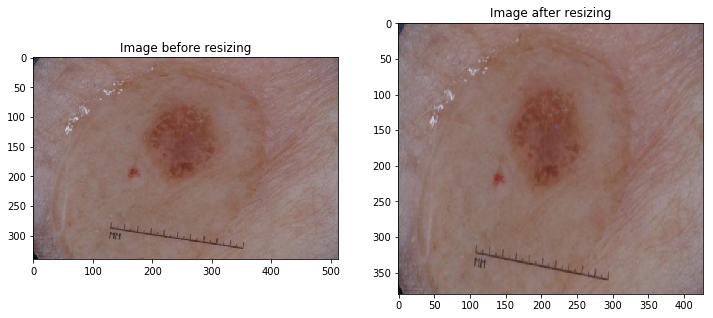

In [ ]:
f, ax = plt.subplots(1,2,figsize=(12,6))
print(f'Shape before resizing: {im1.shape}')
print(f'Shape after resizing: {resized_im1.shape}')
ax[0].imshow(im1)
ax[0].set_title('Image before resizing')
ax[1].imshow(resized_im1)
ax[1].set_title('Image after resizing')

In [ ]:
def save_resize(file, new_shape, dataset):  
    im = imread(f'{dataset}/{file}')
    filename = f'./{dataset}_resized/{file[:-4]}_resized.jpg'
    im_out = resize(im, new_shape, anti_aliasing=True)
    imsave(filename, im_out)

In [ ]:
segmentation_train_list = os.listdir('./Train_segmentation/')
segmentation_train_list

In [ ]:
%%time
for file in segmentation_train_list:
    save_resize(file, average_shape, 'Train_segmentation')

/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0014187_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013738_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0062056_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012406_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013155_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0014529_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0063836_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0027718_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0062849_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012523_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0065688_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0058423_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0014299_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0054284_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013217_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0063775_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013456_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013197_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013798_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0026887_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0070203_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0016027_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012742_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0028633_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013196_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013970_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0068944_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0015251_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0056135_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0006815_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012793_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0015951_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0016053_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0025277_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0028884_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013837_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0068875_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0026182_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0067336_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0065223_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0064852_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0014440_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012945_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0031059_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0071177_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013369_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0029072_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0060471_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0029187_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0063232_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0070105_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0033137_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013027_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012481_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0064997_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013807_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0031814_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0033767_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013026_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0029150_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0033133_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0068151_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0057433_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013863_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0026218_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0061868_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012683_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0073086_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0032689_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0054391_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013302_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0067040_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012682_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0012965_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0027627_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0068130_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0033334_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0032170_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0065845_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013689_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0026722_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013173_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0066487_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0013233_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0014547_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Train_segmentation_resized/ISIC_0072841_segmentation_resized.jpg is a low contrast image
  """


CPU times: user 35min 52s, sys: 14min 27s, total: 50min 19s
Wall time: 17min 10s


In [ ]:
segmentation_test_list = os.listdir('./Test_segmentation/')
segmentation_test_list

In [ ]:
%%time
for file in segmentation_test_list:
    save_resize(file, average_shape, 'Test_segmentation')

/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0025647_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0012662_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0059737_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0014248_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0026346_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0069851_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0069450_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0012544_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0000098_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0064108_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0013355_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0065783_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0069206_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0062313_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0058657_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0013208_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0014286_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0013055_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0055981_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0069545_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0055816_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0032953_segmentation_resized.jpg is a low contrast image
  """
/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0071192_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0013398_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0013527_segmentation_resized.jpg is a low contrast image
  """


/usr/lib/python3/dist-packages/ipykernel_launcher.py:5: UserWarning: ./Test_segmentation_resized/ISIC_0012179_segmentation_resized.jpg is a low contrast image
  """


CPU times: user 11min 42s, sys: 4min 49s, total: 16min 31s
Wall time: 5min 37s


Also for the masks:

In [ ]:
def save_resize_png(file, new_shape, dataset):  
    im = imread(f'{dataset}/{file}')
    filename = f'./{dataset}_resized/{file[:-4]}_resized.png'
    im_out = resize(im, new_shape, anti_aliasing=True)
    imsave(filename, im_out)

In [ ]:
%%time
for file in seg_train_list:
    save_resize_png(file, average_shape, 'Train_seg')

In [ ]:
%%time
for file in seg_test_list:
    save_resize_png(file, average_shape, 'Test_seg')

## 2. Feature extraction:

In automated diagnosis of skin lesions,
feature design is based on the so-called ABCD-rule of dermatoscopy. ABCD represent the asymmetry, border structure, variegated
color, and dermatoscopical structures and define the basis for a diagnosis by a dermatologist.

In the following sections, some important ABCD-rule features will be extracted based on [1]:

In [ ]:
resized_train_list = os.listdir('./Train_segmentation_resized')
resized_train_list[0]

'ISIC_0069638_segmentation_resized.jpg'

In [ ]:
im_feature = imread(f'./Train_segmentation_resized/{resized_train_list[30]}')
im_feature_mask = imread(f'./Train_seg_resized/{resized_train_list[30][:-25]}_seg_resized.png')

Text(0.5, 1.0, 'Skin lesion segmentation mask')

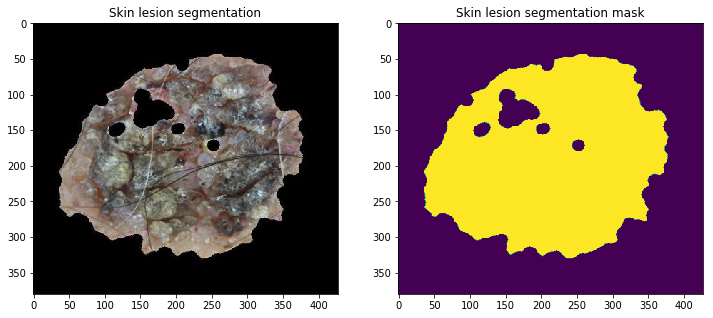

In [ ]:
f, ax = plt.subplots(1,2,figsize=(12,6))
ax[0].imshow(im_feature)
ax[0].set_title('Skin lesion segmentation')
ax[1].imshow(im_feature_mask)
ax[1].set_title('Skin lesion segmentation mask')

### 2.1 Symmetry:

The A (Assymmetry) feature can be obtained using several methods [1]. In this case, we will measure the difference between the quantity of pixels in each side of the axis. 

In [ ]:
im_features = regionprops(im_feature[:,:,0])

First, we must find the minor and major axis of the ellipse that represents the lesion:

In [ ]:
minor_axis = im_features[0].axis_minor_length
major_axis = im_features[0].axis_major_length
orientation = im_features[0].orientation

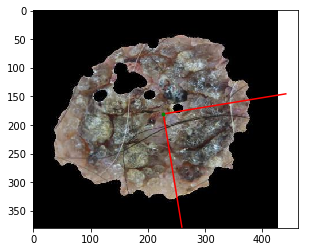

In [ ]:
y0, x0 = im_features[0].centroid

x1 = x0 + 0.5*np.cos(orientation)*minor_axis
y1 = y0 - 0.5*np.sin(orientation)*minor_axis
x2 = x0 - 0.5*np.sin(orientation)*major_axis
y2 = y0 - 0.5*np.cos(orientation)*major_axis


fig, ax = plt.subplots()
ax.imshow(im_feature)
ax.plot((x0, x1), (y0, y1), '-r')
ax.plot((x0, x2), (y0, y2), '-r')
ax.plot(x0,y0,'.g')

Then, we can compute the rotation angle in order to apply a rotate transform to the lesion:

In [ ]:
theta = np.arctan(x1/y1)
theta = np.rad2deg(theta)
theta

34.433478699234364

In [ ]:
rotated_im = img_as_ubyte(rotate(im_feature, theta))

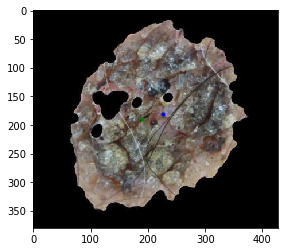

In [ ]:
fig, ax = plt.subplots()
ax.imshow(rotated_im)-
ax.plot(rotated_im.shape[0]//2, rotated_im.shape[0]//2,'.g')
ax.plot(x0,y0,'.b')

Since the lesion axis are parallel to the image axis after the rotation, we can compute the symmetry based on pixel similarity between the quadrants 1,2 and 3,4. This can be done finding the difference in quantity of pixels over a horizontal line (at the centroid "y") and under the same line over the area of the lesion, and doing the same using a vertical line. Therefore, an ideal symmetric lesion has symmetric_x + symmetric_y = 0.

### 2.2 BCD features: 

In this section we will find the assymetry compute the other features:

In [ ]:
properties = ['area', 'perimeter','equivalent_diameter_area','centroid']
feature_table = regionprops_table(im_feature[:,:,0], properties = properties)

In [ ]:
df_feature = pd.DataFrame(feature_table)

In [ ]:
df_feature.loc[0]

area                        2075.000000
perimeter                   1476.517857
equivalent_diameter_area      51.400117
centroid-0                   180.541687
centroid-1                   226.843373
Name: 0, dtype: float64

In [ ]:
def find_region_properties(image): 
    
    intensity_min = image[image!=0].min()
    intensity_max = image.max()
    entropy = shannon_entropy(image[:,:,0]) + shannon_entropy(image[:,:,1]) + shannon_entropy(image[:,:,2])
    
    properties = ['area', 'perimeter','equivalent_diameter_area', 'centroid',
                 'axis_minor_length', 'orientation']
    feature_table = regionprops_table(image[:,:,0], properties=properties)
    im_features = pd.DataFrame(feature_table)
    im_features = im_features.loc[0]
    
    y0, x0 = im_features['centroid-0'], im_features['centroid-1']
    x1 = x0 + 0.5*np.cos(im_features['orientation'])*im_features['axis_minor_length']
    y1 = y0 - 0.5*np.sin(im_features['orientation'])*im_features['axis_minor_length']
    theta = np.arctan(x1/y1)
    rotated_im = img_as_ubyte(rotate(image,theta))
    y0 = int(y0)
    x0 = int(x0)
    symmetry_x = (rotated_im[:x0,:,0]!=0).sum()/im_features['area'] - (rotated_im[x0:,:,0]!=0).sum()/im_features['area']
    symmetry_y = (rotated_im[:,:y0,0]!=0).sum()/im_features['area'] - (rotated_im[:,y0:,0]!=0).sum()/im_features['area']
    symmetry = abs(symmetry_x) + abs(symmetry_y)
    
    im_features.drop(['centroid-0','centroid-1', 'axis_minor_length', 'orientation'], inplace=True)
    im_features['intensity_min'] = intensity_min
    im_features['intensity_max'] = float(intensity_max)
    im_features['entropy'] = entropy
    im_features['symmetry'] = symmetry
    
    return im_features

Then, we have the following features for an image:

In [ ]:
find_region_properties(im_feature)

area                        2075.000000
perimeter                   1476.517857
equivalent_diameter_area      51.400117
intensity_min                  1.000000
intensity_max                247.000000
entropy                       13.052493
symmetry                      21.338795
Name: 0, dtype: float64

We should create a dataframe with the features for the whole dataset:

In [ ]:
%%time
feature_df_train = pd.DataFrame()
for file in df_md_train['ID']:
    im_f = imread(f'./Train_segmentation_resized/{file}_segmentation_resized.jpg')
    prop_series = find_region_properties(im_f)
    prop_series['ID'] = file
    feature_df_train = feature_df_train.append(prop_series)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  app.launch_new_instance()
/usr/lib/python3/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()


CPU times: user 10h 59min 13s, sys: 7h 9min 48s, total: 18h 9min 1s
Wall time: 6h 3min 45s


In [ ]:
feature_df_train.to_csv('feature_df_train.csv')

In [ ]:
%%time
feature_df_test = pd.DataFrame()
for file in df_md_test['ID']:
    im_f = imread(f'./Test_segmentation_resized/{file}_segmentation_resized.jpg')
    prop_series = find_region_properties(im_f)
    prop_series['ID'] = file
    feature_df_test = feature_df_test.append(prop_series)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  app.launch_new_instance()
/usr/lib/python3/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()


CPU times: user 2h 30min 6s, sys: 1h 28min 56s, total: 3h 59min 2s
Wall time: 1h 37s


In [ ]:
feature_df_test.to_csv('feature_df_test.csv')

## 3. Feature preprocessing:

### 3.1 Reading the data and identifying outliers:

In [ ]:
train_df = pd.read_csv('feature_df_train.csv')
train_df.drop(columns='Unnamed: 0', inplace=True)
train_df.head()

,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry,ID
0,1186.0,764.793939,38.859517,1.0,171.0,1.780103,8.595278,ISIC_0028766
1,2163.0,1665.470129,52.478730,1.0,239.0,13.798427,8.893204,ISIC_0071222
2,1113.0,710.090404,37.644596,1.0,210.0,16.229471,17.780773,ISIC_0069434
3,1967.0,1342.541197,50.044602,1.0,253.0,18.572019,27.952211,ISIC_0062098
4,1352.0,993.658946,41.489997,1.0,240.0,14.613742,56.591716,ISIC_0057224


In [ ]:
train_df.describe()

,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry
count,18998.000000,18998.000000,18998.000000,18998.000000,18998.000000,18998.000000,18998.000000
mean,1486.925361,984.088449,39.438960,4.482367,214.141436,11.372679,8176.236367
std,1073.601795,672.581953,18.379291,13.553665,28.389558,5.889345,35368.891643
min,1.000000,0.000000,1.128379,-117.000000,44.000000,0.294136,0.000000
25%,690.000000,477.054085,29.640096,1.000000,196.000000,5.917250,9.907450
50%,1372.000000,950.232539,41.795749,1.000000,216.000000,11.953620,20.557545
75%,2091.000000,1395.508450,51.597906,1.000000,236.000000,17.012869,59.364120
max,13191.000000,5134.433729,129.596693,125.000000,255.000000,21.971796,323000.000000


In fact, a perimeter equal to zero means that something went wrong, possibly the segmentation.

In [ ]:
per_zero = (train_df['perimeter']==0).sum()
print(f'Possible wrong segmentation: {per_zero}')

Possible wrong segmentation: 1453


It is true that we could remove these samples to reduce number of outliers, but it will lead to misclassifications since the learning algorithms would be trained without outliers but the test set may have the same kind of outliers that cannot be removed. 

In [ ]:
train_df = pd.merge(df_md_train, train_df, on='ID')
train_df.head()

,ID,CLASS,SEX,AGE,POSITION,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry
0,ISIC_0028766,2,male,30.0,NaN,1186.0,764.793939,38.859517,1.0,171.0,1.780103,8.595278
1,ISIC_0071222,8,male,85.0,lower extremity,2163.0,1665.470129,52.478730,1.0,239.0,13.798427,8.893204
2,ISIC_0069434,3,male,85.0,head/neck,1113.0,710.090404,37.644596,1.0,210.0,16.229471,17.780773
3,ISIC_0062098,1,male,55.0,head/neck,1967.0,1342.541197,50.044602,1.0,253.0,18.572019,27.952211
4,ISIC_0057224,8,female,45.0,lower extremity,1352.0,993.658946,41.489997,1.0,240.0,14.613742,56.591716


In [ ]:
train_df.isna().sum()

ID                             0
CLASS                          0
SEX                          284
AGE                          324
POSITION                    1970
area                           0
perimeter                      0
equivalent_diameter_area       0
intensity_min                  0
intensity_max                  0
entropy                        0
symmetry                       0
dtype: int64

In [ ]:
train_df.drop(columns=['SEX', 'AGE', 'POSITION'], inplace=True)
train_df.isna().sum()

ID                          0
CLASS                       0
area                        0
perimeter                   0
equivalent_diameter_area    0
intensity_min               0
intensity_max               0
entropy                     0
symmetry                    0
dtype: int64

In [ ]:
X_train = train_df.loc[:,'area':].to_numpy(dtype=np.float64)
y_train = train_df.loc[:,'CLASS'].to_numpy(dtype=np.uint8)

In [ ]:
print(f'X_train shape = {X_train.shape}')
print(f'y_train shape = {y_train.shape}')

X_train shape = (18998, 7)
y_train shape = (18998,)


We have 17545 samples to train the methods using 7 ABCD-rule based features.

Let us do the same in the test set:

In [ ]:
test_df = pd.read_csv('feature_df_test.csv')
test_df.drop(columns='Unnamed: 0', inplace=True)
test_df.head()

,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry,ID
0,1687.0,1289.150324,46.346037,1.0,198.0,8.720051,25.555424,ISIC_0055289
1,1321.0,888.433550,41.011577,1.0,201.0,15.397203,38.747918,ISIC_0062682
2,1349.0,910.759451,41.443940,1.0,255.0,20.242879,33.380282,ISIC_0057706
3,1661.0,994.847763,45.987508,1.0,205.0,3.128528,0.785069,ISIC_0031702
4,450.0,336.403066,23.936537,1.0,216.0,18.306937,113.880000,ISIC_0069272


In [ ]:
test_df.describe()

,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry
count,6333.000000,6333.000000,6333.000000,6333.000000,6333.000000,6333.000000,6333.000000
mean,1480.490131,981.084502,39.169480,4.812885,214.511922,11.373826,8118.214532
std,1114.807035,688.412435,18.730344,14.584134,28.792334,5.830377,34565.257354
min,1.000000,0.000000,1.128379,1.000000,85.000000,0.334434,0.000000
25%,666.000000,471.728968,29.120054,1.000000,195.000000,6.017025,9.786780
50%,1346.000000,937.398016,41.397831,1.000000,218.000000,11.855344,20.405172
75%,2066.000000,1383.570635,51.288526,1.000000,237.000000,17.003067,64.221209
max,15544.000000,5363.634739,140.681326,120.000000,255.000000,21.960375,320936.000000


In [ ]:
per_zero = (test_df['perimeter']==0).sum()
print(f'Possible wrong segmentation: {per_zero}')

Possible wrong segmentation: 496


However, we cannot remove these samples...

In [ ]:
test_df = pd.merge(df_md_test, test_df, on='ID')
test_df.head()

,ID,SEX,AGE,POSITION,area,perimeter,equivalent_diameter_area,intensity_min,intensity_max,entropy,symmetry
0,ISIC_0055289,female,50.0,lower extremity,1687.0,1289.150324,46.346037,1.0,198.0,8.720051,25.555424
1,ISIC_0062682,male,65.0,lower extremity,1321.0,888.433550,41.011577,1.0,201.0,15.397203,38.747918
2,ISIC_0057706,female,75.0,NaN,1349.0,910.759451,41.443940,1.0,255.0,20.242879,33.380282
3,ISIC_0031702,male,70.0,head/neck,1661.0,994.847763,45.987508,1.0,205.0,3.128528,0.785069
4,ISIC_0069272,male,60.0,lower extremity,450.0,336.403066,23.936537,1.0,216.0,18.306937,113.880000


In [ ]:
test_df.drop(columns=['SEX', 'AGE', 'POSITION'], inplace=True)
test_df.isna().sum()

ID                          0
area                        0
perimeter                   0
equivalent_diameter_area    0
intensity_min               0
intensity_max               0
entropy                     0
symmetry                    0
dtype: int64

In [ ]:
X_test = test_df.loc[:,'area':].to_numpy(dtype=np.float64)

### 3.2 Scaling the data:

Many of the learning methods benefits from scaling the data. Therefore, the features will be scaled in this section.

First, we can see the data statistics before scaling:

In [ ]:
print(f'X_train mean = {X_train.mean()}')
print(f'X_train std = {X_train.std()}')
print(f'X_test mean = {X_test.mean()}')
print(f'X_test std = {X_test.std()}')

X_train mean = 1559.5265168960677
X_train std = 13656.771387263218
X_test mean = 1549.9510398208338
X_test std = 13355.455126047826


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Then, we can see that the mean is equal to zero and the standard deviation to one after scaling:

In [ ]:
print(f'X_train mean = {X_train.mean()}')
print(f'X_train std = {X_train.std()}')
print(f'X_test mean = {X_test.mean()}')
print(f'X_test std = {X_test.std()}')

X_train mean = -6.303391278126857e-17
X_train std = 0.9999999999999999
X_test mean = 0.0015525815831651942
X_test std = 1.0202411957323467


### 3.3 One-hot encoding:

Since the classes are categorical and does not have an ordered relation between them, we should use one-hot encoding to prevent that the classification algorithms learn an incorrect order relation between the classes.

In [ ]:
enc = OneHotEncoder(categories='auto', sparse=False)
enc.fit(y_train.reshape(-1, 1))
y_train_enc = enc.transform(y_train.reshape(-1, 1))

## 4. Classification methods:

In this section, classification methods were applied. In section 4.1, we applied a linear classification method, which in fact does not seems to have good predictions. Secondly, in section 4.2 a logistic regression was applied, which achieved better results than LDA. Right after, the KNN algorithm was performed with poor results compared to the logistic regression. 

Finally, the grid search method found the best hyperparameters to achieve 26.74% of accuracy using Support Vector Machines and 25.82% using Random Forests.

### 4.1 Linear Discriminant Analysis (LDA):

In [ ]:
LDA = LinearDiscriminantAnalysis()
cv_LDA = cross_validate(LDA, X_train, y_train, cv=5,return_train_score=True, scoring='balanced_accuracy')
print("Score on train data: ",cv_LDA['train_score'])
print("Validation Score: ",cv_LDA['test_score'])

Score on train data:  [0.1948241  0.19836735 0.19597607 0.19684313 0.19762079]
Validation Score:  [0.19197563 0.19021176 0.20134615 0.19746629 0.19507432]


### 4.2 Logistic Regression:

In [ ]:
LR = LogisticRegression(class_weight='balanced')
cv_LR = cross_validate(LR, X_train, y_train, cv=5, return_train_score = True, scoring='balanced_accuracy')
print("Score on train data: ",cv_LR['train_score'])
print("Validation Score: ",cv_LR['test_score'])

Score on train data:  [0.2668184  0.26899697 0.26134571 0.25458533 0.26649478]
Validation Score:  [0.23564865 0.24063053 0.28027386 0.27230214 0.25063515]


### 4.3 K-nearest neighbors:

In [ ]:
KNN = KNeighborsClassifier()
cv_KNN = cross_validate(KNN, X_train, y_train, cv=5, return_train_score = True, scoring='balanced_accuracy')
print("Score on train data: ",cv_KNN['train_score'])
print("Validation Score: ",cv_KNN['test_score'])

Score on train data:  [0.30300307 0.30382049 0.30475626 0.3003961  0.30744852]
Validation Score:  [0.1951043  0.18975592 0.18969705 0.20293968 0.19901416]


### 4.4 Support Vector Machine:

In [ ]:
%%time
p_grid_SVM = {'C': [1e-3,1e-2,1e-1,1,2,3,4,5,6,7,8,9,1e1],
              'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]}
SVM = SVC(kernel='rbf', class_weight='balanced')
grid_SVM = GridSearchCV(SVM, p_grid_SVM, cv=5, scoring="balanced_accuracy")
grid_SVM.fit(X_train, y_train)

print("Best training score: {}".format(grid_SVM.best_score_))
print("Best training params: {}".format(grid_SVM.best_params_))

Best training Score: 0.2674019733951967
Best training params: {'C': 10.0, 'gamma': 0.1}
CPU times: user 1h 47min 44s, sys: 55.1 s, total: 1h 48min 39s
Wall time: 1h 48min 39s


In [ ]:
grid_SVM.predict(X_test)

array([1], dtype=uint8)

### 4.5 Random Forests:

In [ ]:
%%time
RF=RandomForestClassifier(class_weight='balanced')
p_grid_RF = {'n_estimators': [10,15,20,25,30], 'min_samples_leaf': [2,3,4,5,6], 'max_features': ['sqrt','log2']}   
grid_RF = GridSearchCV(estimator=RF, param_grid=p_grid_RF, scoring="balanced_accuracy", cv=5)
grid_RF.fit(X_train, y_train)

print("Best Validation Score: {}".format(grid_RF.best_score_))
print("Best params: {}".format(grid_RF.best_params_))

Best Validation Score: 0.25819234664055957
Best params: {'max_features': 'log2', 'min_samples_leaf': 6, 'n_estimators': 30}
CPU times: user 1min 23s, sys: 45.1 ms, total: 1min 23s
Wall time: 1min 23s


## 5. Convolutional Neural Network: 

We know from the course theory (and notably observing the state-of art [2] [3]) that Convolutional Neural Networks achieve important results at image classification problems, specially in skin lesion classification. Then, we developed an CNN architecture that led to 40% of accuracy in the validation set. In this section, a CNN will be created, trained and will predict the class of the test set, using the non-segmented training set.

### 5.1 Separating the data: 

```image_dataset_from_directory``` from keras needs an specific dataset folder organization that were created using the following cells:

In [ ]:
for idx, item in train_df.iterrows():
  shutil.copyfile(f"./Train/{item['ID']}.jpg", 
                  f"./training_data/class_{item['CLASS']}/{item['ID']}.jpg")

In [ ]:
for idx, item in test_df.iterrows():
  shutil.copyfile(f"./Test/{item['ID']}.jpg", 
                  f"./test_data/{item['ID']}.jpg")

In [ ]:
train_ds = keras.utils.image_dataset_from_directory(
    directory='./training_data/',
    labels='inferred',
    label_mode='categorical',
    batch_size=64,
    image_size=(380, 427),
    interpolation='nearest',
    validation_split = 0.2,
    subset="training",
    seed=13)

validation_ds = keras.utils.image_dataset_from_directory(
    directory='./training_data/',
    labels='inferred',
    label_mode='categorical',
    batch_size=64,
    image_size=(380, 427),
    interpolation='nearest',
    validation_split = 0.2,
    subset="validation",
    seed=13)

test_ds = keras.utils.image_dataset_from_directory(
    directory='./test_data/',
    labels=None,
    label_mode=None,
    image_size=(380,427),
    interpolation='nearest',
    batch_size=1,
    shuffle=False)

Found 18998 files belonging to 8 classes.
Using 15199 files for training.
Found 18998 files belonging to 8 classes.
Using 3799 files for validation.
Found 6333 files belonging to 1 classes.


### 5.2 Creating the model:

In [ ]:
learning_rate = 0.001
n_epochs = 60
batch_size = 128
input_shape = (380, 427, 3)

Taking the class weights into account:

In [ ]:
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                 classes=np.unique(y_train),
                                                 y=y_train)
class_weights = dict(enumerate(class_weights))

In [ ]:
class_weights

{0: 0.7003096431731053,
 1: 0.24590970280625454,
 2: 0.9529494382022472,
 3: 3.6534615384615385,
 4: 1.2066819105691058,
 5: 13.266759776536313,
 6: 12.498684210526315,
 7: 5.041932059447983}

In [ ]:
with tf.device('/GPU:0'): #based on "flower classification" from keras documentation
    model = Sequential([
    Rescaling(1./255, input_shape=input_shape),
    Conv2D(16, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.5),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.5),
    Conv2D(128, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.5),
    Flatten(),
    Dense(8,activation='softmax')
  ])
    model.compile(optimizers.Adam(learning_rate), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

### 5.3 Training the model:

In [ ]:
model.fit(train_ds, epochs=n_epochs, 
          validation_data=validation_ds, 
          class_weight=class_weights,
          verbose=True)

Epoch 1/50
238/238 [==============================] - 51s 171ms/step - loss: 2.0166 - categorical_accuracy: 0.3312 - val_loss: 1.8696 - val_categorical_accuracy: 0.4256
Epoch 2/50
238/238 [==============================] - 39s 162ms/step - loss: 1.8650 - categorical_accuracy: 0.3462 - val_loss: 1.7514 - val_categorical_accuracy: 0.4643
Epoch 3/50
238/238 [==============================] - 39s 164ms/step - loss: 1.7719 - categorical_accuracy: 0.3763 - val_loss: 1.7031 - val_categorical_accuracy: 0.4159
Epoch 4/50
238/238 [==============================] - 40s 166ms/step - loss: 1.6765 - categorical_accuracy: 0.3963 - val_loss: 1.6213 - val_categorical_accuracy: 0.4335
Epoch 5/50
238/238 [==============================] - 40s 166ms/step - loss: 1.5581 - categorical_accuracy: 0.4180 - val_loss: 1.7120 - val_categorical_accuracy: 0.3767
Epoch 6/50
238/238 [==============================] - 39s 164ms/step - loss: 1.4520 - categorical_accuracy: 0.4331 - val_loss: 1.6988 - val_categorical_acc

We should then save the trained model:

In [ ]:
model.save("cnn_flower_dropout")
!zip -r cnn_flower_dropout.zip ./cnn_flower_dropout
files.download("cnn_flower_dropout.zip")

INFO:tensorflow:Assets written to: cnn_flower_dropout/assets
  adding: cnn_flower_dropout/ (stored 0%)
  adding: cnn_flower_dropout/saved_model.pb (deflated 90%)
  adding: cnn_flower_dropout/variables/ (stored 0%)
  adding: cnn_flower_dropout/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: cnn_flower_dropout/variables/variables.index (deflated 66%)
  adding: cnn_flower_dropout/keras_metadata.pb (deflated 92%)
  adding: cnn_flower_dropout/assets/ (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 6. Transfer learning:

More recent papers have shown that transfer learning can be applied for this specific problem in order to improve the accuracy [4] [5]. Then, we have applied a transfer learning algorithm using the ResNet101 pretrained network (since it fits the best to the problem [4]) and achieved a greater accuracy than the other methods.

### 6.1 Importing and adding layers to the model:

In [ ]:
with tf.device('/GPU:0'):
  base_model = keras.applications.resnet.ResNet101(
      weights='imagenet',  # Load weights pre-trained on ImageNet.
      input_shape=input_shape,
      include_top=False)  # Do not include the ImageNet classifier at the top.

171458560/171446536 [==============================] - 2s 0us/step


In [ ]:
base_model.trainable = False

In [ ]:
with tf.device('/GPU:0'):
  inputs = Input(shape=input_shape)
  x = base_model(inputs, training=False)
  # Convert features of shape `base_model.output_shape[1:]` to vectors
  x = GlobalAveragePooling2D()(x)
  # A Dense classifier with a 8 class and sofmax activation function
  outputs = Dense(8, activation='softmax')(x)
  model_tl = Model(inputs, outputs)

### 6.2 Training the transfer learning model:

In [ ]:
learning_rate = 0.001
with tf.device('/GPU:0'):
# with strategy.scope():
  model_tl.compile(optimizer=optimizers.Adam(learning_rate), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [ ]:
model_tl.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 380, 427, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, 12, 14, 2048)      42658176  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 8)                 16392     
                                                                 
Total params: 42,674,568
Trainable params: 16,392
Non-trainable params: 42,658,176
_________________________________________________________________


In [ ]:
model_tl.fit(train_ds, 
             epochs=n_epochs, 
             validation_data=validation_ds, 
             class_weight=class_weights,
             verbose=True)

Epoch 1/60
238/238 [==============================] - 346s 1s/step - loss: 1.7154 - categorical_accuracy: 0.3811 - val_loss: 1.6328 - val_categorical_accuracy: 0.3717
Epoch 2/60
238/238 [==============================] - 344s 1s/step - loss: 1.3983 - categorical_accuracy: 0.4829 - val_loss: 1.4350 - val_categorical_accuracy: 0.4670
Epoch 3/60
238/238 [==============================] - 343s 1s/step - loss: 1.2584 - categorical_accuracy: 0.5277 - val_loss: 1.2735 - val_categorical_accuracy: 0.5399
Epoch 4/60
238/238 [==============================] - 344s 1s/step - loss: 1.1915 - categorical_accuracy: 0.5407 - val_loss: 1.1087 - val_categorical_accuracy: 0.6059
Epoch 5/60
238/238 [==============================] - 343s 1s/step - loss: 1.1105 - categorical_accuracy: 0.5645 - val_loss: 1.2525 - val_categorical_accuracy: 0.5346
Epoch 6/60
238/238 [==============================] - 344s 1s/step - loss: 1.0616 - categorical_accuracy: 0.5814 - val_loss: 1.1735 - val_categorical_accuracy: 0.572

In [ ]:
model_tl.save("cnn_tl_noseg")
!zip -r cnn_tl_noseg.zip ./cnn_tl_noseg
files.download("cnn_tl_noseg.zip")

INFO:tensorflow:Assets written to: cnn_tl_noseg/assets
  adding: cnn_tl_noseg/ (stored 0%)
  adding: cnn_tl_noseg/saved_model.pb (deflated 92%)
  adding: cnn_tl_noseg/assets/ (stored 0%)
  adding: cnn_tl_noseg/variables/ (stored 0%)
  adding: cnn_tl_noseg/variables/variables.index (deflated 80%)
  adding: cnn_tl_noseg/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: cnn_tl_noseg/keras_metadata.pb (deflated 96%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 6.3 Saving the predictions:

In [ ]:
predictions_tl = {}
for k, item in enumerate(os.listdir('test_data')):
  im_t = img_as_ubyte(resize(imread(f'./test_data/{item}'), input_shape, order=0))
  prediction = model_tl.predict(tf.expand_dims(im_t,axis=0)).argmax(axis=-1) + 1
  predictions_tl[k] = [item[:-4], prediction[0]]

df_prediction_tl = pd.DataFrame.from_dict(predictions_tl, orient='index', columns=['ID','CLASS'])
df_prediction_tl.head()

,ID,CLASS
0,ISIC_0059941,1
1,ISIC_0066826,3
2,ISIC_0063373,8
3,ISIC_0010229,2
4,ISIC_0054532,1


We can see the prediction frequency for each class in the cell below:

In [ ]:
(df_prediction_tl['CLASS'].value_counts()/df_prediction_tl.shape[0]).sort_index()

1    0.142429
2    0.398074
3    0.154903
4    0.048634
5    0.157903
6    0.023528
7    0.009790
8    0.064740
Name: CLASS, dtype: float64

In [ ]:
df_prediction_tl.to_csv('Submission_cnn_tl_noseg.csv', index=False)
files.download('Submission_cnn_tl_noseg.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 7. Conclusions:





During this project we were able to apply several techniques that were presented in the courses. Purposely, the segmentation was made using two of the tutorial section algorithms. As we could see, CNNs achieve the best results the architectures implemented using transfer learning.


## 8. References




[1] Konstantin Korotkov, Rafael Garcia,
Computerized analysis of pigmented skin lesions: A review,
Artificial Intelligence in Medicine,
Volume 56, Issue 2,
2012,
Pages 69-90,
ISSN 0933-3657,
https://doi.org/10.1016/j.artmed.2012.08.002.

[2] Yaqub, M., Jinchao, F., Zia, M. S., Arshid, K., Jia, K., Rehman, Z. U., & Mehmood, A. (2020). State-of-the-Art CNN Optimizer for Brain Tumor Segmentation in Magnetic Resonance Images. Brain sciences, 10(7), 427. https://doi.org/10.3390/brainsci10070427

[3] I. González-Díaz, "DermaKNet: Incorporating the Knowledge of Dermatologists to Convolutional Neural Networks for Skin Lesion Diagnosis," in IEEE Journal of Biomedical and Health Informatics, vol. 23, no. 2, pp. 547-559, March 2019, doi: 10.1109/JBHI.2018.2806962.

[4] Goceri,E. Kakaras, A. (2020) "Comparative evaluations of CNN based networks for skin lesion classification," 2020 International Conferences Computer Graphics, Visualization, Computer Vision and Image Processing.  

[5] Z. Rahman and A. M. Ami, "A Transfer Learning Based Approach for Skin Lesion Classification from Imbalanced Data," 2020 11th International Conference on Electrical and Computer Engineering (ICECE), 2020, pp. 65-68, doi: 10.1109/ICECE51571.2020.9393155.